Content is used for course CEES 5843 Hydrology at the university of Oklahoma.

Created by Allen Li

Date updated: Jan. 11, 2021



---



# About Jupyter notebook!

Since this tutorial walks through steps for hydrologic-hydraulic modelling within jupyter notebook, we provide some basic hints and tips to use Jupyter notebook. Hopefully you can find it useful for your work!

For your reading:

[Comprehensive intro to Jupyter notebook and python syntax](https://colab.research.google.com/drive/10kUcXxQZ0aBtGnxWFOlpPJYOgdjCBXVL)

[Jupyter notebook tutorial (on your own computer)](https://www.dataquest.io/blog/jupyter-notebook-tutorial/)

__Tips:__

__Ctrl+Enter__: run the current cell

__Shift+Enter__: run the current cell and activate the next cell

This notebook contains some pre-run results. In order to engage yourself in the modelling, I highly **recommend** you re-run the cells and play with some parameters.

NOTE: in case you make any traceable changes, you'd better save this notebook to your own google drive repository by clicking "Save to my..." on the manu bar. 

SUGGESTIONS: If you have any suggestions to improve your understanding, please submit an issue at [Github repo](https://github.com/chrimerss/CEES5843_Hydrology).

# Introduction - CREST-iMAP

You may have learned the hydrologic processes in previous lecture. 



In [ ]:
%%html
<iframe src="https://drive.google.com/file/d/1FwUuuTL8Zu7C0y7gf9_uPjd0X4fSh__N/preview" width="640" height="480"></iframe>

# Preparation

First, we need to download the source code from github and install some necesarry python packages and system environment.

Run the cell below (it will take some time to set it up).

In [ ]:
try:
  # On colab we can install all the packages we need via the notebook
  #
  # First download the clinic repository
  import os
  os.chdir('/content')

  # Now install environment using tool
  !git clone https://github.com/chrimerss/CEES5843_Hydrology > /dev/null 2>&1
  !mv CEES5843_Hydrology/* .
  !sh install.sh
 
except:
  pass


[1/4]  Installing gdal...
[2/4]  Installing netCDF4 ...
[3/4]  uncompressing ...
[4/4]  install python packages...
Completed!


Some preparing works: import prerequisite packages.

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import folium
from google.colab import files
import geopandas as gpd
import cresthh
%matplotlib inline

# Allow inline jshtml animations
from matplotlib import rc
rc('animation', html='jshtml')

ModuleNotFoundError: ignored

# Setup a study domain

Inside folder 'area', we provided a sample study region in Texas, but you can replace with any other region you want, as long as you can find the shp file.

This shp file only tells the boundary, but you have to provide additional information to discretize the model domain.

Let's take a look at our test basin. The original shp file contains the whole Houston region, but we only simuate the Greens Bayou river basin for simplicity.

In [ ]:
study_area=gpd.read_file('area/area.shp').loc[[0]]
study_area= study_area.to_crs('EPSG:32215')
json_gpd= study_area.to_crs(epsg='4326').to_json()

In [ ]:
m = folium.Map([29.9,-95.3],zoom_start=10)
basemap= folium.TileLayer(
    tiles= "https://mti.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",
    attr='Google',
    name="Google Satellite",
    overlay=True,
    control=True
)
basin= folium.features.GeoJson(json_gpd)
m.add_child(basin)
m.add_child(basemap)
m

In [ ]:
'''
We use function to create a domain with desired resolution
'''

resolution = 500 # 1km resolution, we set this because of tradeoff of computation
boundary= np.array(study_area.iloc[0].geometry.exterior)
domain= cresthh.anuga.create_domain_from_regions(
    boundary,
    boundary_tags={'bottom': [0]},
    maximum_triangle_area=resolution**2,
    mesh_filename='mymesh.msh' # store this mesh as a file, so you can directly import next time

)
domain.set_name('GreensBayou')

[]


Yes, we created the domain with coarse resolution, let us visualize it!

The mesh is probably too dense to recognize, but you can adjust mesh resolution to see the changes.

Figure files for each frame will be stored in _plot


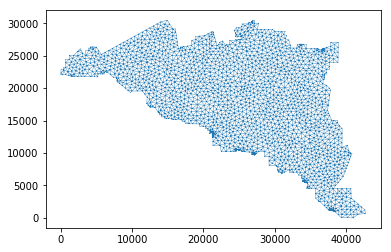

In [ ]:
dplotter = cresthh.anuga.Domain_plotter(domain)  
plt.triplot(dplotter.triang, linewidth = 0.4);

# Setup Environmental variables

We need to acquire the Digital Elevation Model (DEM) of the study area, which constrains the flow direction.

For CREST model, there are seven model parameters you have to configure first. Those parameters can be fine-tuned via calibration. For now, we will just use a-priori parameters.



In [ ]:
# first, we need to tell the projection of this region, so that model can convert other projection into the desired one.
domain.set_proj("+proj=utm +zone=15, +north +ellps=WGS84 +datum=WGS84 +units=m +no_defs")

# Setup terrain model with provided DEM
domain.set_quantity('elevation', filename='dem/dem.tif', location='centroids') # Use function for elevation
# Setup friction parameter with provided geotif
domain.set_quantity('friction',  filename='params_manningn.tif', location='centroids')
# The initial water stage, here we assume dry channel, meaning stage is the same as elevation 
domain.set_quantity('stage', expression='elevation', location='centroids')  
# Hydraulic conductivity
domain.set_quantity('Ksat', filename='params_ksat_usa.tif', location='centroids')
# Mean soil water capacity
domain.set_quantity('WM', filename='params_wm_usa.tif', location='centroids')
# exponental factor of the VIC model
domain.set_quantity('B', filename='params_b_usa.tif', location='centroids')
# Impervious area ratio
domain.set_quantity('IM', filename='params_im_usa.tif', location='centroids')

Let us visualize those variables to get a picture.

In [ ]:
def plot_quantity(domain,quantity_name, ax, **figkwargs):
    '''
    Plot quantity given domain and quantity name

    Args:
    ------------------------
    domain: Domain object
    quantity_name: str

    '''
    X,Y,A,V= domain.quantities[quantity_name].get_vertex_values(smooth=True)
    A[np.isnan(A)]=0
    map= ax.tripcolor(X,Y,V,A, **figkwargs)
    plt.colorbar(mappable=map)
    ax.set_title(quantity_name)


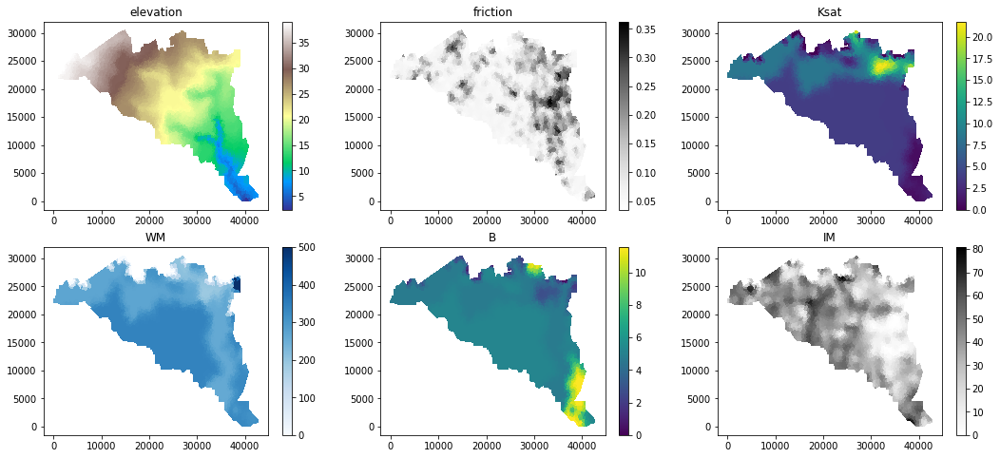

In [ ]:
fig= plt.figure(figsize=(18,8))
ax=fig.add_subplot(231)
plot_quantity(domain, 'elevation', ax=ax, cmap='terrain')
ax=fig.add_subplot(232)
plot_quantity(domain, 'friction',ax=ax, cmap='Greys')
ax=fig.add_subplot(233)
plot_quantity(domain, 'Ksat',ax=ax)
ax=fig.add_subplot(234)
plot_quantity(domain, 'WM',ax=ax, cmap='Blues', vmin=0, vmax=500)
ax=fig.add_subplot(235)
plot_quantity(domain, 'B',ax=ax)
ax=fig.add_subplot(236)
plot_quantity(domain, 'IM',ax=ax, cmap='Greys')


# Setup forcing data

After initialize the model domain, we need to make hydrologic forcing data to drive the model. Normally forcing data contains rain rate, evaporation rate. Here we use examples from Multi-Radar Multi-Sensor rainfall product that has a temporal resolution of 2 mins and spatial resolution of 1 km. It is argubly the highest resolution rainfall product in the US, even in the world.

Here we conduct event-based simulation i.e., 1 hour. Therefore, evaporation is not an important factor. But if you want to simulate over a long period, evaporation could account for large fraction.

In [ ]:
domain.set_precip_dir('mrms201708',pattern='PrecipRate_00.00_%Y%m%d-%H%M00.grib2-var0-z0.tif', freq='2M')
domain.set_evap_dir('',pattern='',freq='1D')
domain.set_timestamp('20170825000000', format='%Y%m%d%H%M%S')
domain.set_time_interval('2M')
domain.set_coupled(True) #this tells the model we want hydrologic-hydraulic coupled simulation


## Setup Boundary Conditions

The rectangular domain has 4 tagged boundaries, left, top, right and bottom. We need to set boundary conditons for each of these tagged boundaries. We can set Dirichlet type BC with specified values of stage, and x and y "momentum". Another common BC is `Reflective_boundary` which mimic a wall. 

Also, we need to realize that there will be upstream flow into our domain. So we have to factor it in our model simulation. Here we assume a steady 100 m^3/s flow from the left into our domain.

In [ ]:
Bi = cresthh.anuga.Dirichlet_boundary([0.4, 0, 0])         # Inflow
Bo = cresthh.anuga.Dirichlet_boundary([-2, 0, 0])          # Inflow
Br = cresthh.anuga.Reflective_boundary(domain)            # Solid reflective wall
Bt = cresthh.anuga.Transmissive_boundary([domain])

domain.set_boundary({'left': Bi, 'exterior': Br, 'bottom': Bt})


center = (278776.0276-dplotter.xllcorner, 3319560.5388-dplotter.yllcorner)
line=[[278776.0276, 3319560.5388], [278751.52,3319600.25]]
inflow= cresthh.anuga.Inlet_operator(domain, line, Q=100)
# region0 = cresthh.anuga.Region(domain, center=center, radius=radius)
# fixed_inflow = anuga.Inlet_operator(domain, region0 , Q=100)

## Run the Evolution

We have done model configuration, the next step is to run the model! Here we only showcase the simulation for 6 hours.

This probably takes several minutes.

In [ ]:
for t in domain.evolve(yieldstep=120, duration=6 * 3600): # the time recorded is in seconds,
  
    
    domain.print_timestepping_statistics()
    dplotter.save_depth_frame(vmin=0.0, vmax=2.0)

    
# Read in the png files stored during the evolve loop
dplotter.make_depth_animation() 

Time = 2017-08-25 00:00:00, steps=0 (120s)
Time = 2017-08-25 00:02:00, delta t = 1000.00000000, steps=1 (0s)
Time = 2017-08-25 00:04:00, delta t = 162.36390384, steps=1 (0s)
Time = 2017-08-25 00:06:00, delta t = 129.91349922, steps=1 (0s)
Time = 2017-08-25 00:08:00, delta t = 126.25868424, steps=1 (0s)
Time = 2017-08-25 00:10:00, delta t in [110.80868255, 121.24937467], steps=2 (0s)
Time = 2017-08-25 00:12:00, delta t = 120.01507885, steps=1 (0s)
Time = 2017-08-25 00:14:00, delta t in [111.32106315, 113.90627861], steps=2 (0s)
Time = 2017-08-25 00:16:00, delta t in [109.97632038, 111.31968855], steps=2 (0s)
Time = 2017-08-25 00:18:00, delta t in [109.39203995, 109.92679191], steps=2 (0s)
Time = 2017-08-25 00:20:00, delta t in [109.43850648, 110.21254984], steps=2 (0s)
Time = 2017-08-25 00:22:00, delta t in [104.63360468, 109.93004594], steps=2 (0s)
Time = 2017-08-25 00:24:00, delta t in [99.43915218, 103.87276137], steps=2 (0s)
Time = 2017-08-25 00:26:00, delta t in [94.87788709, 98.48